## **Loading Libraries & Other Necessary Functions**

In [1]:
# Import OS libraries
import os
import itertools

# Data handling tools
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import cv2
import os
import imutils
import tensorflow as tf
import keras


In [2]:
import matplotlib.image as mpimg
%matplotlib inline
import random
from IPython.display import Image

In [3]:
from google.colab import files
from io import BytesIO
# Display images.
from IPython.display import display
from PIL import ImageEnhance
from PIL import Image

In [4]:
!pip install Pillow

In [5]:

from glob import glob
from tensorflow.keras.models import Model

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , classification_report

from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,  BatchNormalization, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam , Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dense

In [6]:
import torch
import torchvision
from torchvision import datasets, transforms
import cv2

**Vgg16 Related Info**

In [7]:
inception = tf.keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [8]:
for layer in inception.layers:
   layer.trainable=False

In [9]:
import os
import shutil

In [10]:
inception.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [11]:
for layer in inception.layers:
    print(layer.name, layer.trainable)

input_layer False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 False
block5_conv2 False
block5_conv3 False
block5_pool False


**Mounting Drive**

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Loading Training & Testing Sets**

In [ ]:
test_set = '/content/drive/MyDrive/MRI data Ashif_zahin/Testing'
train_set='/content/drive/MyDrive/MRI data Ashif_zahin/Training'

In [13]:
test_set = '/content/drive/MyDrive/Dataset/Testing'
train_set='/content/drive/MyDrive/Dataset/Training'

In [14]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

In [15]:
def get_folder(test_folder):
    plt.figure(figsize=(20,20))
    for i in range(3):
        file = random.choice(os.listdir(test_folder))
        image_path= os.path.join(test_folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(3,3,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

**Dont run this line of codes**

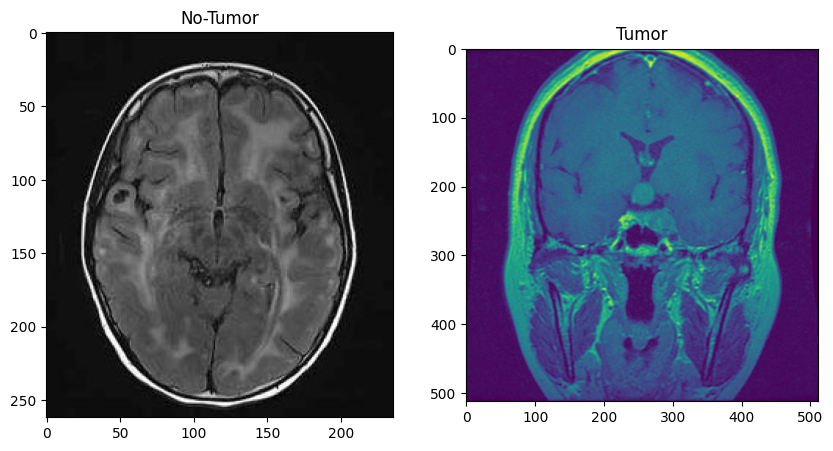

In [50]:
import matplotlib.pyplot as plt
import os

def compare_images(image1_path, image2_path):
  # Load images
  # Get an image file from within the directories
  image1_file = os.path.join(image1_path, os.listdir(image1_path)[0])
  image2_file = os.path.join(image2_path, os.listdir(image2_path)[0])

  img1 = plt.imread(image1_file)
  img2 = plt.imread(image2_file)

  # Create subplots
  fig, axes = plt.subplots(1, 2, figsize=(10, 5))

  # Display images
  axes[0].imshow(img1)
  axes[0].set_title('No-Tumor')
  axes[1].imshow(img2)
  axes[1].set_title('Tumor')

  plt.show()

# Example usage - Pass directory paths
compare_images('/content/drive/MyDrive/Dataset/Testing/notumor', '/content/drive/MyDrive/Dataset/Testing/pituitary')

Text(0.5, 1.0, 'GLioma')

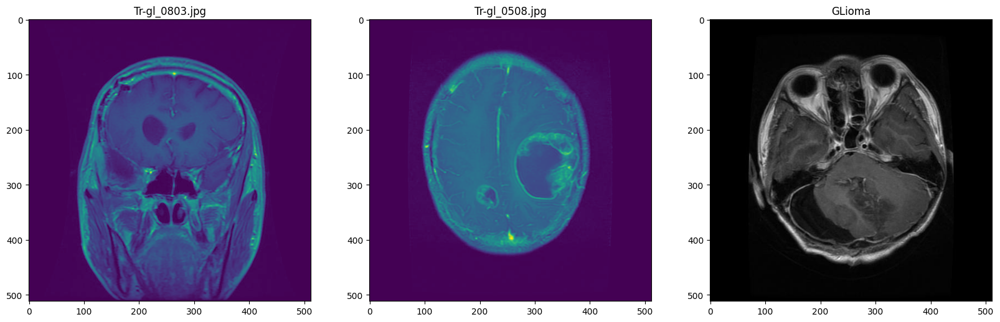

In [19]:
get_folder("/content/drive/MyDrive/Dataset/Training/glioma")
plt.title('GLioma')

Text(0.5, 1.0, 'Meningioma')

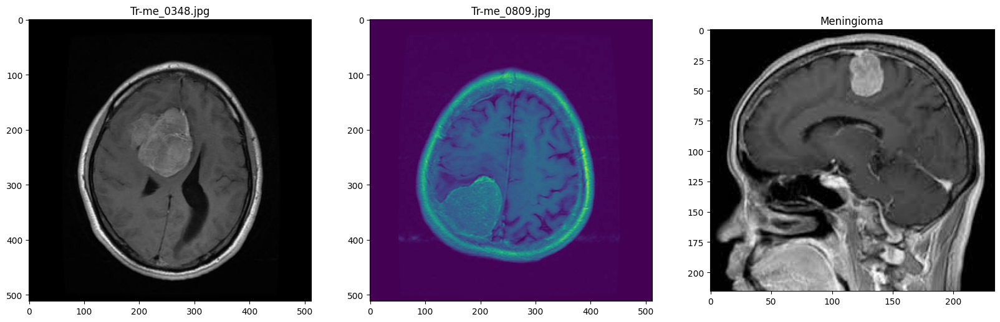

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/meningioma")
plt.title('Meningioma')

Text(0.5, 1.0, 'No Tumor')

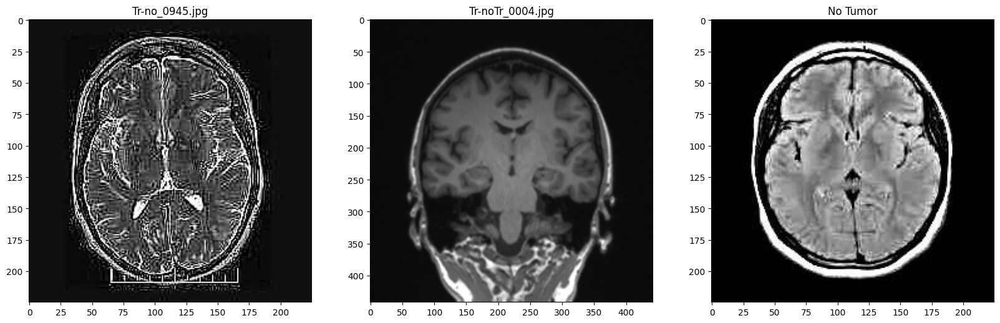

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/notumor")
plt.title('No Tumor')

Text(0.5, 1.0, 'Pituitary')

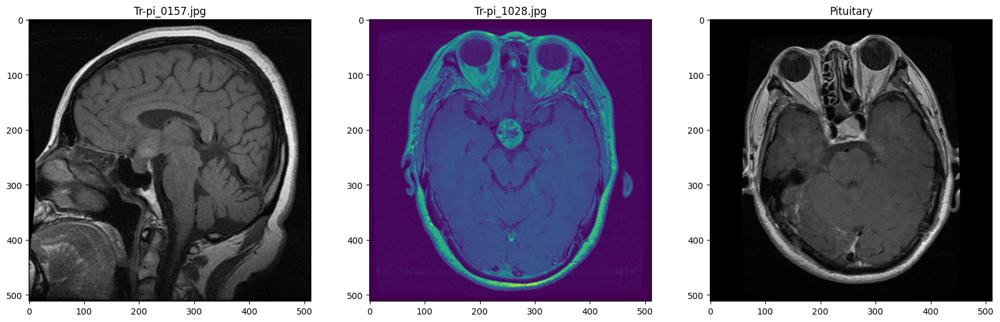

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/pituitary")
plt.title('Pituitary')

Text(0.5, 1.0, 'GLioma')

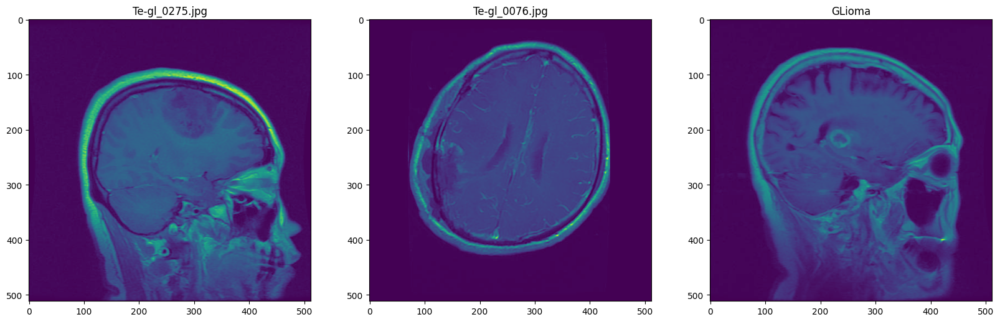

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/glioma")
plt.title('GLioma')

Text(0.5, 1.0, 'Meningioma')

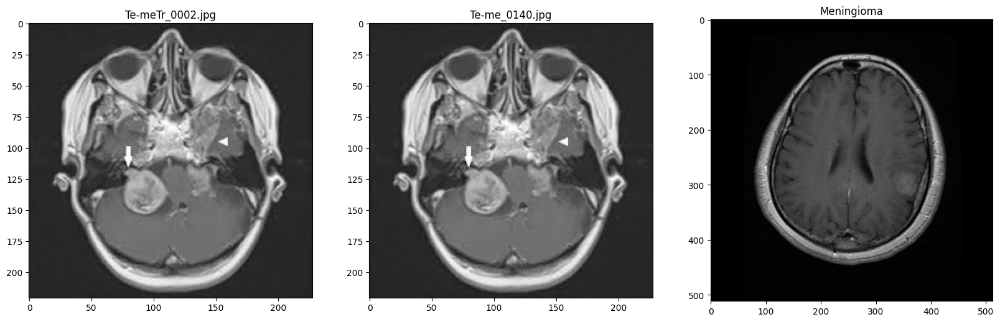

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/meningioma")
plt.title('Meningioma')

Text(0.5, 1.0, 'No Tumor')

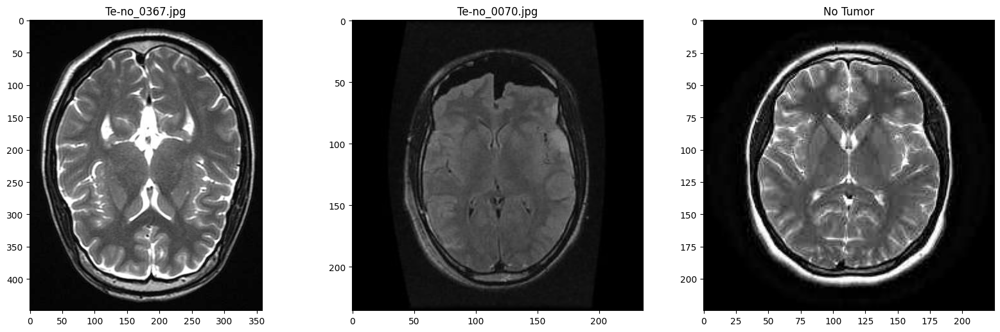

In [26]:
get_folder("/content/drive/MyDrive/Dataset/Testing/notumor")
plt.title('No Tumor')

Text(0.5, 1.0, 'Pituitary')

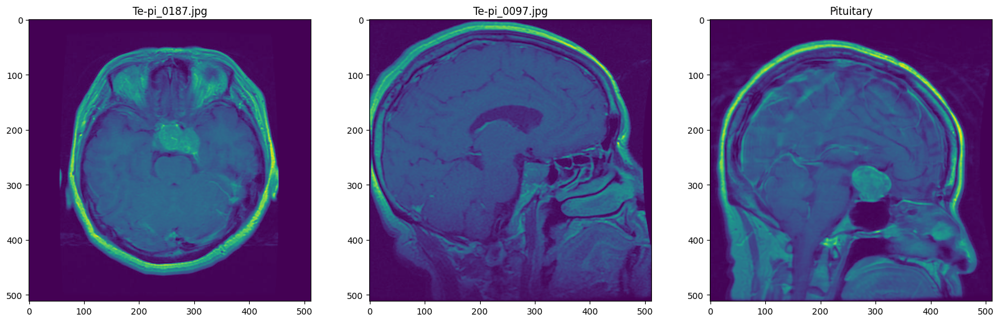

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/pituitary")
plt.title('Pituitary')

Run again from here

In [16]:
test=data('/content/drive/MyDrive/Dataset/Testing')

In [17]:
train=data('/content/drive/MyDrive/Dataset/Training')

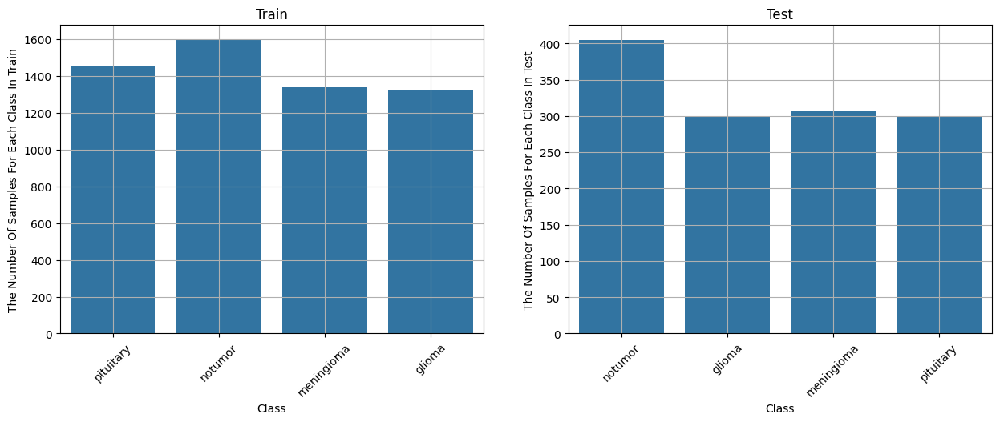

In [18]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.countplot(x=train.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,2,2)
ax = sns.countplot(x=test.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

**Preprocessing The Image**

In [51]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

x_train = [] # training images.
y_train  = [] # training labels.
x_test = [] # testing images.
y_test = [] # testing labels.

image_size = 224


for label in labels:
    trainPath = os.path.join(train_set,label)
    for file in tqdm(os.listdir(trainPath)):
        image = cv2.imread(os.path.join(trainPath, file),0)# load images in gray.
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50) # remove images noise.
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE) # produce a pseudocolored image.
        image = cv2.resize(image, (image_size, image_size)) # resize images into 224*224.

        x_train.append(image)
        y_train.append(labels.index(label))

    testPath = os.path.join(test_set,label)
    for file in tqdm(os.listdir(testPath)):
        image = cv2.imread(os.path.join(testPath, file),0)
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50)
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE)
        image = cv2.resize(image, (image_size, image_size))
        x_test.append(image)
        y_test.append(labels.index(label))

100%|██████████| 300/300 [00:04<00:00, 63.88it/s]


In [52]:
def crop_img(img):
	"""
	Finds the extreme points on the image and crops the rectangular out of them
	"""
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (3, 3), 0)

	# threshold the image, then perform a series of erosions +
	# dilations to remove any small regions of noise
	thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
	thresh = cv2.erode(thresh, None, iterations=2)
	thresh = cv2.dilate(thresh, None, iterations=2)

	# find contours in thresholded image, then grab the largest one
	cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)

	# find the extreme points
	extLeft = tuple(c[c[:, :, 0].argmin()][0])
	extRight = tuple(c[c[:, :, 0].argmax()][0])
	extTop = tuple(c[c[:, :, 1].argmin()][0])
	extBot = tuple(c[c[:, :, 1].argmax()][0])
	ADD_PIXELS = 0
	new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

	return new_img

if __name__ == "__main__":
	training = train_set
	testing = test_set
	training_dir = os.listdir(training)
	testing_dir = os.listdir(testing)
	IMG_SIZE = 224

	for dir in training_dir:
		save_path = 'cleaned/Training/'+ dir
		path = os.path.join(training,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

	for dir in testing_dir:
		save_path = 'cleaned/Testing/'+ dir
		path = os.path.join(testing,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

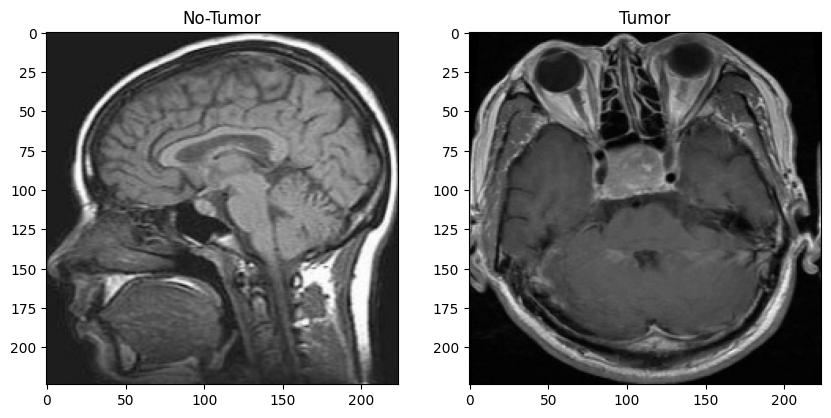

In [57]:
import matplotlib.pyplot as plt
import os

def compare_images(image1_path, image2_path):
  # Load images
  # Get an image file from within the directories
  image1_file = os.path.join(image1_path, os.listdir(image1_path)[0])
  image2_file = os.path.join(image2_path, os.listdir(image2_path)[0])

  img1 = plt.imread(image1_file)
  img2 = plt.imread(image2_file)

  # Create subplots
  fig, axes = plt.subplots(1, 2, figsize=(10, 5))

  # Display images
  axes[0].imshow(img1)
  axes[0].set_title('No-Tumor')
  axes[1].imshow(img2)
  axes[1].set_title('Tumor')

  plt.show()

# Example usage - Pass directory paths
compare_images("/content/cleaned/Training/notumor", "/content/cleaned/Training/pituitary")

**Checking For Path Here We have 4 Labels**

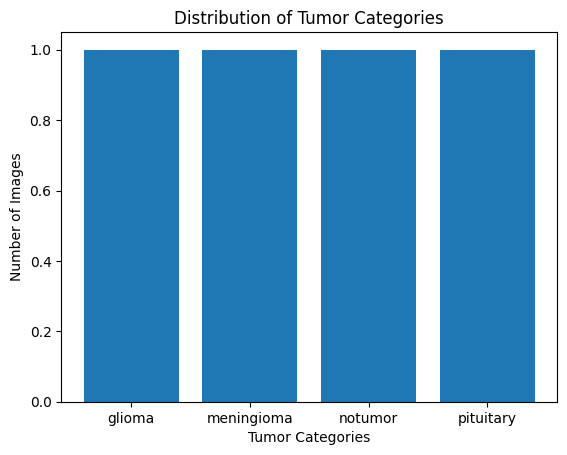

In [53]:
unique_labels, counts = np.unique(labels, return_counts=True)
plt.bar(unique_labels, counts)
plt.xlabel('Tumor Categories')
plt.ylabel('Number of Images')
plt.title('Distribution of Tumor Categories')
plt.show()

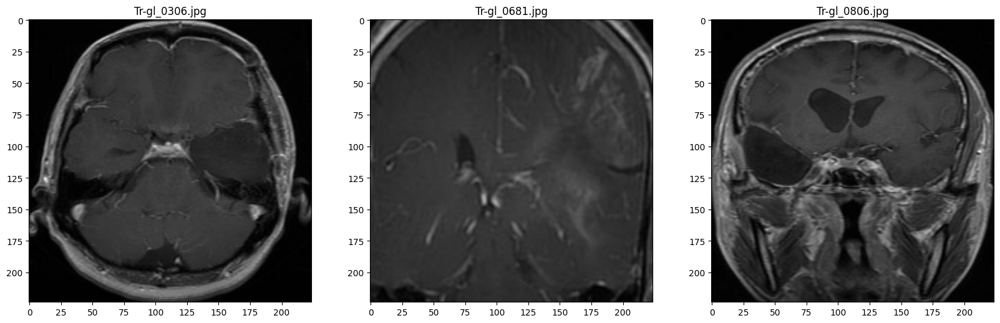

In [ ]:
get_folder("/content/cleaned/Training/glioma")

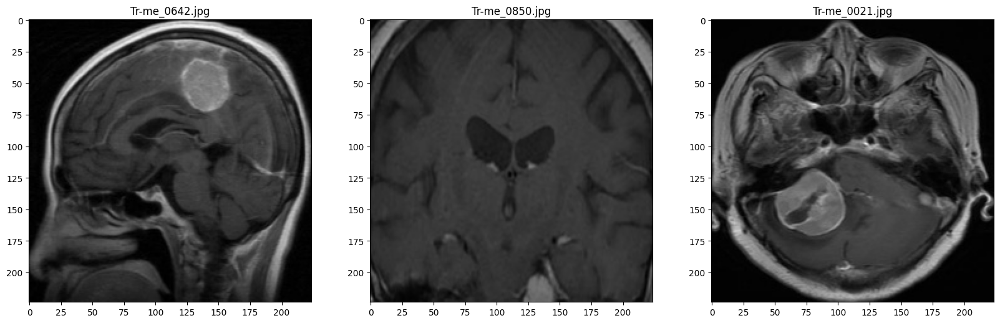

In [ ]:
get_folder("/content/cleaned/Training/meningioma")

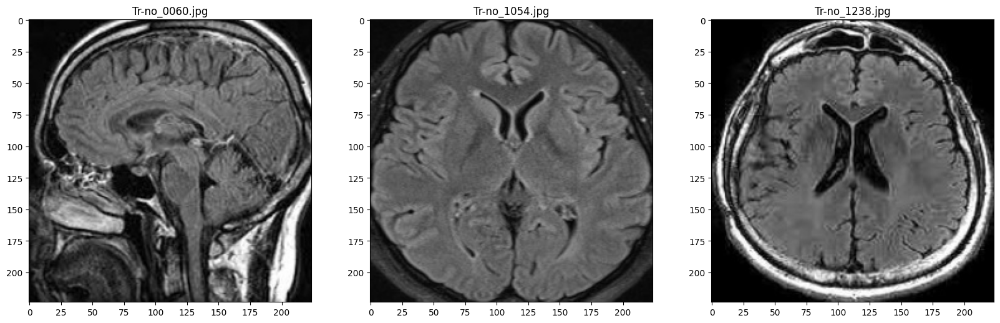

In [ ]:
get_folder("/content/cleaned/Training/notumor")

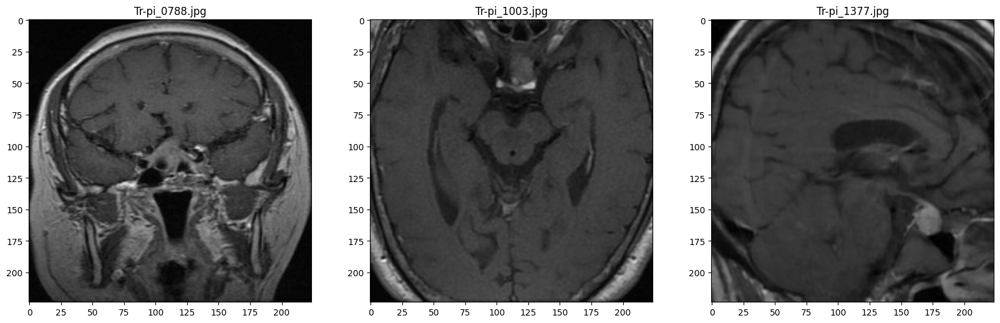

In [ ]:
get_folder("/content/cleaned/Training/pituitary")

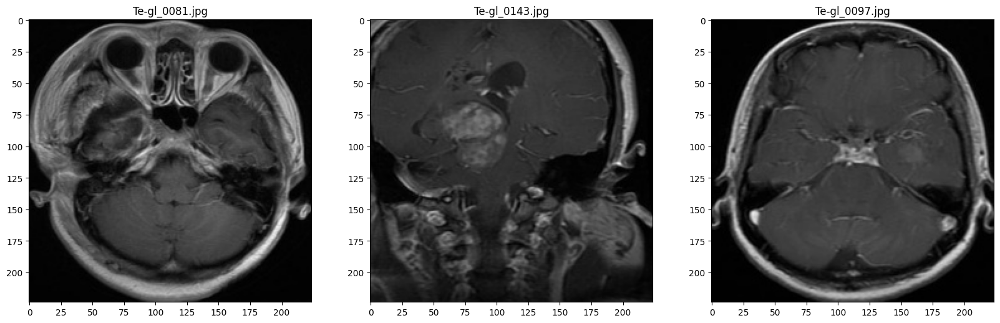

In [ ]:
get_folder("/content/cleaned/Testing/glioma")

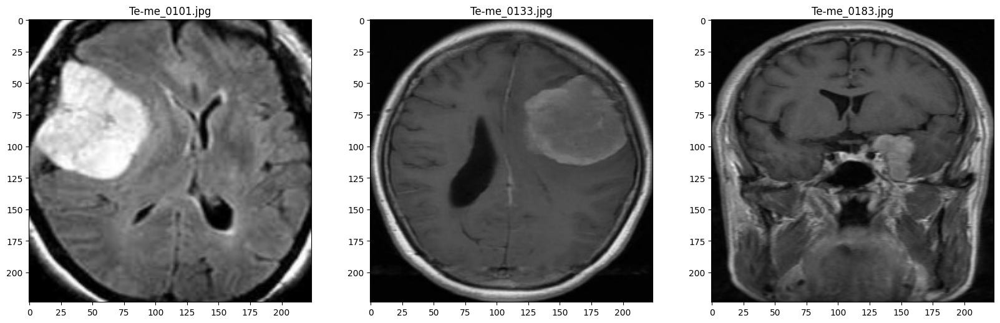

In [ ]:
get_folder("/content/cleaned/Testing/meningioma")

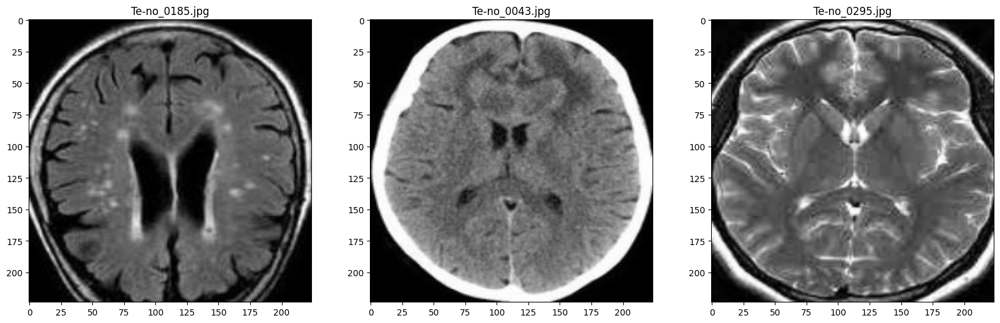

In [ ]:
get_folder("/content/cleaned/Testing/notumor")

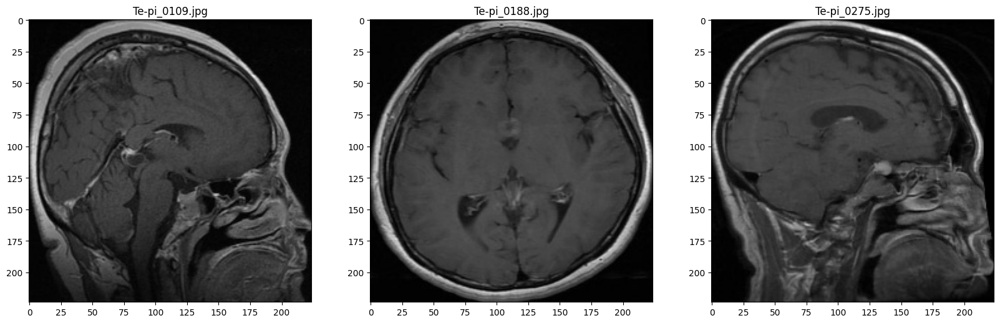

In [ ]:
get_folder("/content/cleaned/Testing/pituitary")

In [ ]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/glioma',
 '/content//cleaned/Training/notumor',
 '/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/meningioma']

In [ ]:
folders_test=glob('/content//cleaned/Testing/*')
folders_test

['/content//cleaned/Testing/glioma',
 '/content//cleaned/Testing/notumor',
 '/content//cleaned/Testing/pituitary',
 '/content//cleaned/Testing/meningioma']

In [ ]:
len(folders_train)

4

**Training the Dataset**

In [ ]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [ ]:
prediction=Dense(4, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [ ]:
model=Model(inception.input, prediction)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          65,6

 Total params: 14,780,868 (56.38 MB)

 Trainable params: 66,180 (258.52 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

**For Normalizing**

In [ ]:
# train_datagen=ImageDataGenerator(rescale=1./255,
#                                  shear_range=0.2,
#                                  zoom_range=0.2,
#                                  horizontal_flip=False)

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
# test_datagen=ImageDataGenerator(rescale=1./255)


**Creating Batches**

In [ ]:
# train_set=train_datagen.flow_from_directory('/content//cleaned/Training',
#                                             target_size=(224,224),
#                                             batch_size=64,
#                                             class_mode='categorical'
#                                             )
train_set = datagen.flow_from_directory(
    '/content//cleaned/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 4571 images belonging to 4 classes.


In [ ]:
# test_set=test_datagen.flow_from_directory('/content//cleaned/Testing',
#                                             target_size=(224,224),
#                                             batch_size=64,
#                                             class_mode='categorical'
#                                             )

test_set = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleaned/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 1311 images belonging to 4 classes.


**Callback Function**

In [58]:
checkpoint_filepath = '/tmp/ckpt/checkpoint.weights.h5'
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [59]:
callback =tf.keras.callbacks.BackupAndRestore(backup_dir="/tmp/backup")

In [60]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [ ]:
r=model.fit(train_set,validation_data=test_set,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 93s 466ms/step - accuracy: 0.8858 - auc: 0.9824 - loss: 0.3125 - specificity_at_sensitivity: 0.9990 - val_accuracy: 0.8246 - val_auc: 0.9621 - val_loss: 0.5208 - val_specificity_at_sensitivity: 0.9962
Epoch 2/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 121s 370ms/step - accuracy: 0.8757 - auc: 0.9823 - loss: 0.3157 - specificity_at_sensitivity: 0.9989 - val_accuracy: 0.8330 - val_auc: 0.9656 - val_loss: 0.4881 - val_specificity_at_sensitivity: 0.9957
Epoch 3/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 69s 353ms/step - accuracy: 0.8749 - auc: 0.9817 - loss: 0.3203 - specificity_at_sensitivity: 0.9984 - val_accuracy: 0.8429 - val_auc: 0.9668 - val_loss: 0.4712 - val_specificity_at_sensitivity: 0.9959
Epoch 4/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 84s 365ms/step - accuracy: 0.8881 - auc: 0.9830 - loss: 0.3041 - specificity_at_sensitivity: 0.9987 - val_accuracy: 0.8101 - val_auc: 0.9600 - val_loss: 0.5389 - val_specificity_at_sensitivity: 0.9952
Epoch 5/150
191/191 ━━━━━━━━━━━

**Checking The Results**

In [ ]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
26,0.895865,0.986186,0.269978,0.999125,0.858124,0.970826,0.461311,0.996949
27,0.906804,0.987957,0.253472,0.998906,0.857361,0.973859,0.439859,0.997457
28,0.895865,0.986770,0.268377,0.999344,0.854310,0.973858,0.423319,0.997203
29,0.900897,0.987301,0.261225,0.998906,0.843631,0.965936,0.511668,0.995932
30,0.894553,0.987172,0.264407,0.999125,0.855072,0.973557,0.431390,0.996949


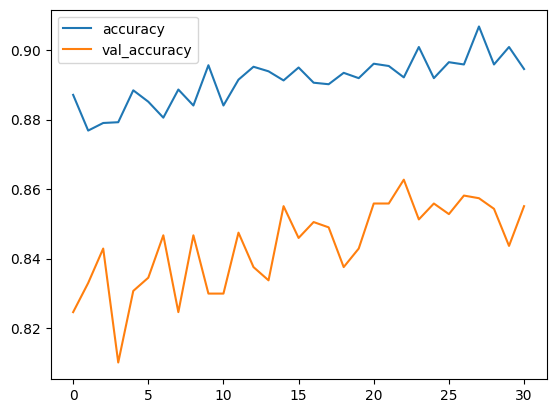

In [ ]:
df_inception[["accuracy","val_accuracy"]].plot();

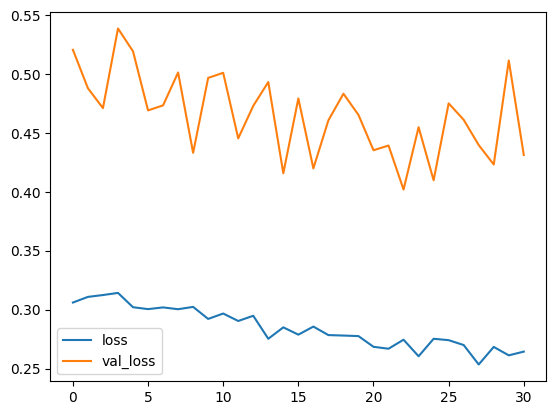

In [ ]:
df_inception[["loss","val_loss"]].plot();

In [ ]:
hist_=pd.DataFrame(r.history)
hist_


,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.887114,0.983119,0.306085,0.999052,0.824561,0.962084,0.520775,0.996186
1,0.876832,0.982809,0.310879,0.998979,0.832952,0.965573,0.488091,0.995678
2,0.879020,0.982562,0.312458,0.998469,0.842868,0.966779,0.471219,0.995932
3,0.879239,0.982066,0.314259,0.998323,0.810069,0.959984,0.538861,0.995169
4,0.888427,0.983472,0.302105,0.998469,0.830664,0.963594,0.519454,0.996440
5,0.885145,0.983737,0.300498,0.998323,0.834477,0.968095,0.469280,0.997203
6,0.880551,0.983421,0.301941,0.998687,0.846682,0.966705,0.473544,0.996695
7,0.888646,0.983581,0.300412,0.999125,0.824561,0.964346,0.501477,0.996949
8,0.884052,0.983390,0.302384,0.998469,0.846682,0.971686,0.433248,0.996949
9,0.895646,0.984598,0.292165,0.998687,0.829901,0.966459,0.496877,0.996695


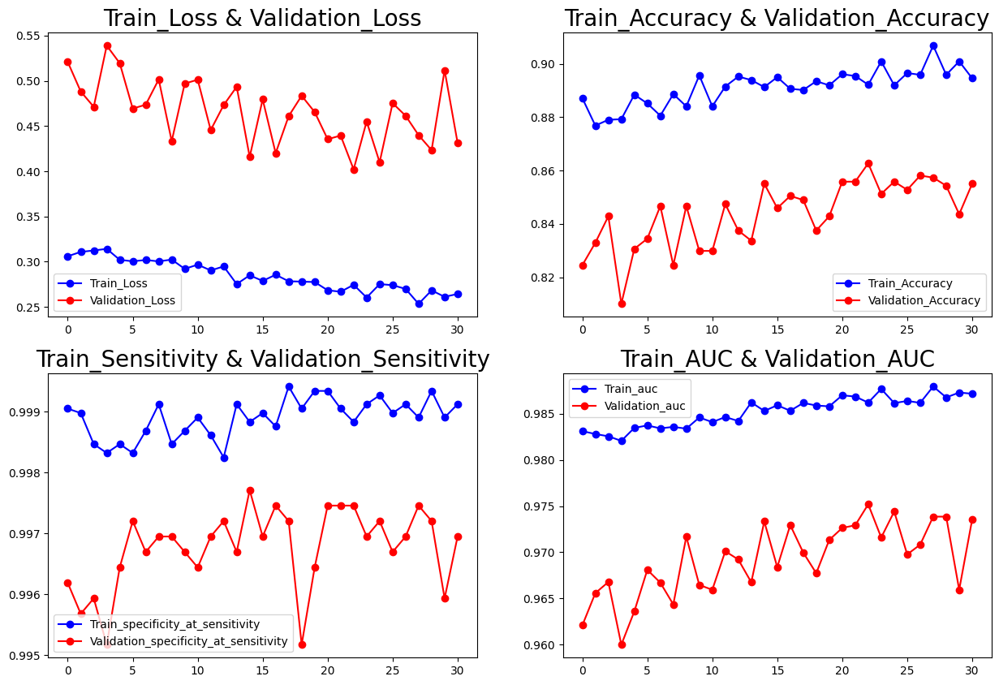

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score, acc ,sensitivity,auc= model.evaluate(test_set)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - accuracy: 0.8023 - auc: 0.9605 - loss: 0.5200 - specificity_at_sensitivity: 0.9946
Test Loss = 0.4313901960849762
Test Accuracy = 0.8550724387168884
Test Sensitivity = 0.9969488978385925
Test AUC = 0.9735566973686218


In [ ]:
y_test =test_set.classes
predictions = model.predict(test_set)

# Find the class with the highest predicted probability for each sample
y_pred = np.argmax(predictions, axis=1)

y_test = np.ravel(y_test)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
print(df)

55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step
      Actual  Prediction
0          0           0
1          0           0
2          0           0
3          0           1
4          0           1
...      ...         ...
1306       3           3
1307       3           3
1308       3           3
1309       3           3
1310       3           3

[1311 rows x 2 columns]


array([[231,  55,   0,  14],
       [ 20, 227,  15,  44],
       [  8,  18, 371,   8],
       [  5,   3,   0, 292]])

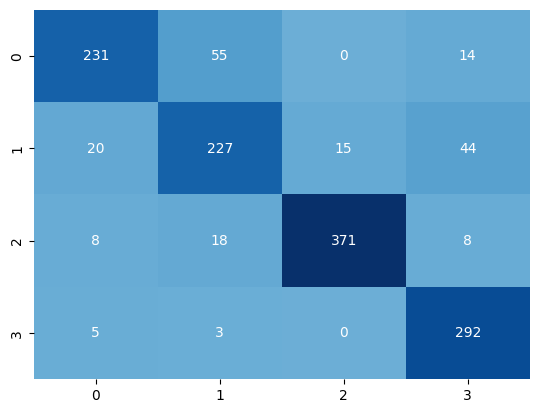

In [ ]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.88      0.77      0.82       300
           1       0.75      0.74      0.75       306
           2       0.96      0.92      0.94       405
           3       0.82      0.97      0.89       300

    accuracy                           0.86      1311
   macro avg       0.85      0.85      0.85      1311
weighted avg       0.86      0.86      0.85      1311



## **Just taking tumor categories**

In [61]:
import shutil
import os

In [62]:
drop=('/content//cleaned/Training/notumor')
shutil.rmtree(drop)

In [63]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/glioma',
 '/content//cleaned/Training/meningioma']

In [64]:
shutil.rmtree('/content//cleaned/Testing/notumor')

In [65]:
folders_test=glob('/content//cleaned/Testing/*')
folders_test

['/content//cleaned/Testing/pituitary',
 '/content//cleaned/Testing/glioma',
 '/content//cleaned/Testing/meningioma']

In [66]:
len(folders_train)

3

In [67]:
len(folders_test)

3

In [68]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [69]:
prediction=Dense(3, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [70]:
model1=Model(inception.input, prediction)
model1.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          65,6

 Total params: 14,780,739 (56.38 MB)

 Trainable params: 66,051 (258.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [71]:
model1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

In [72]:
datagen1 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [73]:
train_set1 = datagen1.flow_from_directory(
    '/content//cleaned/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 3295 images belonging to 3 classes.


In [74]:
test_set1 = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleaned/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 906 images belonging to 3 classes.


In [75]:
r=model1.fit(train_set1,validation_data=test_set1,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


138/138 ━━━━━━━━━━━━━━━━━━━━ 99s 570ms/step - accuracy: 0.4765 - auc: 0.6725 - loss: 1.0106 - specificity_at_sensitivity: 0.7208 - val_accuracy: 0.7086 - val_auc: 0.8640 - val_loss: 0.7450 - val_specificity_at_sensitivity: 0.9459
Epoch 2/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 50s 350ms/step - accuracy: 0.6902 - auc: 0.8648 - loss: 0.7250 - specificity_at_sensitivity: 0.9352 - val_accuracy: 0.7252 - val_auc: 0.8899 - val_loss: 0.6460 - val_specificity_at_sensitivity: 0.9603
Epoch 3/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 81s 344ms/step - accuracy: 0.7482 - auc: 0.8974 - loss: 0.6266 - specificity_at_sensitivity: 0.9623 - val_accuracy: 0.7450 - val_auc: 0.8938 - val_loss: 0.6320 - val_specificity_at_sensitivity: 0.9680
Epoch 4/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 81s 340ms/step - accuracy: 0.7657 - auc: 0.9122 - loss: 0.5786 - specificity_at_sensitivity: 0.9671 - val_accuracy: 0.7384 - val_auc: 0.8963 - val_loss: 0.6280 - val_specificity_at_sensitivity: 0.9685
Epoch 5/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 82s

In [76]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
44,0.870410,0.972692,0.315447,0.996965,0.828918,0.953977,0.442016,0.992826
45,0.874052,0.969917,0.330201,0.995296,0.818985,0.948021,0.479697,0.991170
46,0.865857,0.968719,0.337453,0.994841,0.824503,0.953526,0.430093,0.993378
47,0.876176,0.970881,0.323953,0.994234,0.822296,0.952016,0.457086,0.993929
48,0.863429,0.970927,0.325375,0.995751,0.827815,0.954173,0.451854,0.992274


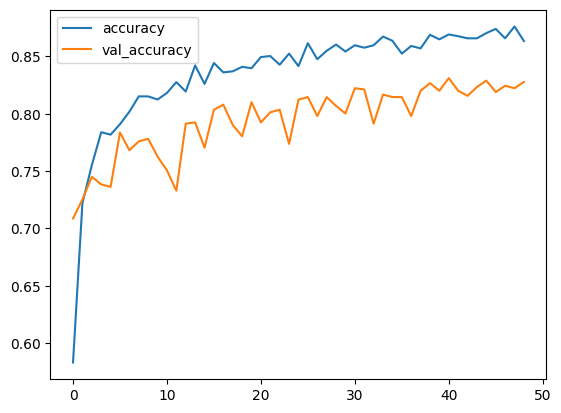

In [77]:
df_inception[["accuracy","val_accuracy"]].plot();

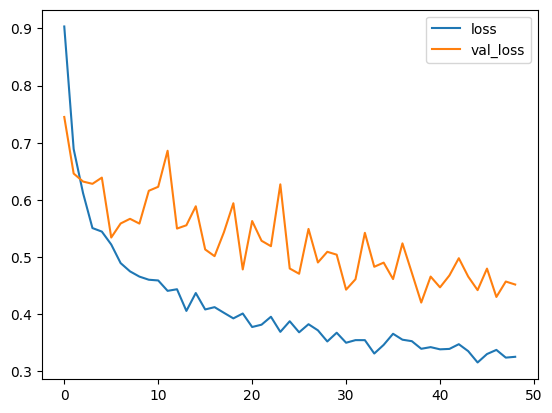

In [78]:
df_inception[["loss","val_loss"]].plot();

In [79]:
hist_=pd.DataFrame(r.history)
hist_

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.583005,0.772772,0.903371,0.848862,0.708609,0.864028,0.745036,0.945916
1,0.722003,0.880585,0.688867,0.951290,0.725166,0.889909,0.646032,0.960265
2,0.755083,0.902375,0.611806,0.962974,0.745033,0.893790,0.632020,0.967991
3,0.783915,0.921319,0.550639,0.973900,0.738411,0.896336,0.628043,0.968543
4,0.781791,0.920685,0.544469,0.973293,0.736203,0.893085,0.638915,0.963024
5,0.790895,0.927692,0.521854,0.981487,0.783664,0.923382,0.534087,0.980132
6,0.801821,0.936545,0.489309,0.985736,0.768212,0.918773,0.558648,0.977373
7,0.815175,0.940181,0.474852,0.983763,0.775938,0.917949,0.566840,0.977373
8,0.815175,0.942093,0.465694,0.985736,0.778146,0.921482,0.558466,0.980132
9,0.812443,0.943391,0.460226,0.985736,0.762693,0.910888,0.615894,0.974614


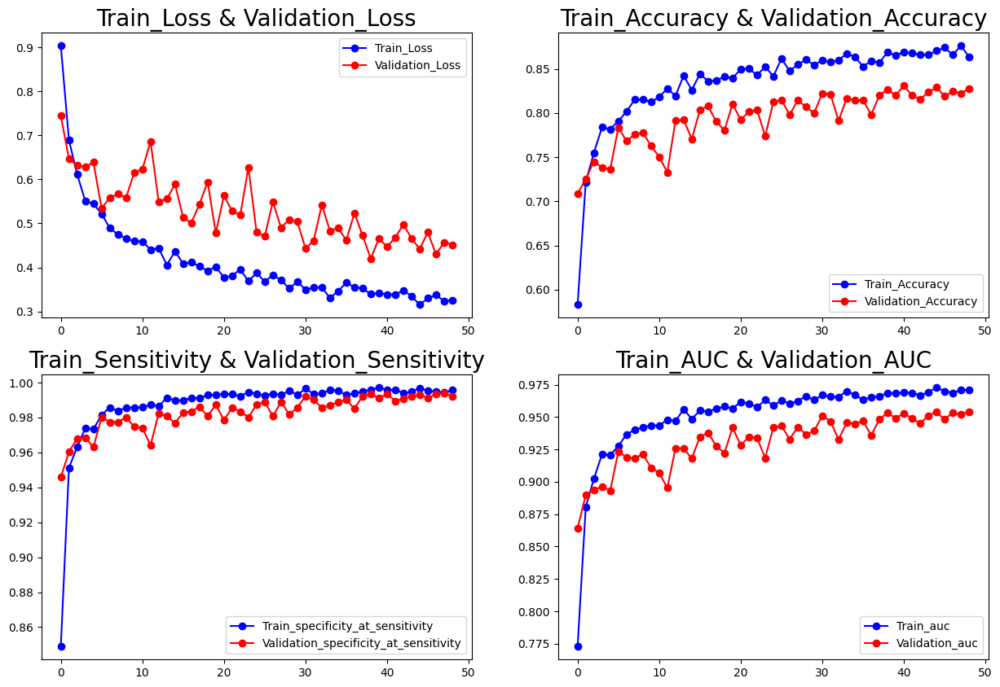

In [80]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [81]:
score,acc,sensitivity,auc= model1.evaluate(test_set1)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.7790 - auc: 0.9413 - loss: 0.5506 - specificity_at_sensitivity: 0.9910
Test Loss = 0.4518543779850006
Test Accuracy = 0.8278145790100098
Test Sensitivity = 0.99227374792099
Test AUC = 0.9541732668876648


In [82]:
y_test1 =test_set1.classes
predictions = model1.predict(test_set1)

# Find the class with the highest predicted probability for each sample
y_pred1 = np.argmax(predictions, axis=1)

y_test1 = np.ravel(y_test1)
df = pd.DataFrame({'Actual': y_test1, 'Prediction': y_pred1})
print(df)

38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step
     Actual  Prediction
0         0           0
1         0           0
2         0           0
3         0           1
4         0           1
..      ...         ...
901       2           2
902       2           2
903       2           2
904       2           2
905       2           2

[906 rows x 2 columns]


array([[210,  78,  12],
       [ 15, 253,  38],
       [  1,  12, 287]])

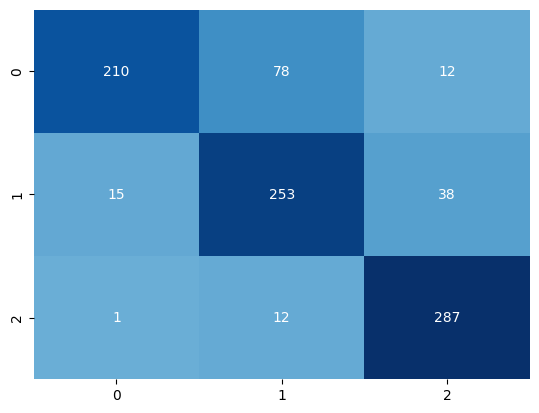

In [83]:
CM = confusion_matrix(y_test1,y_pred1)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [84]:
ClassificationReport = classification_report(y_test1,y_pred1)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.93      0.70      0.80       300
           1       0.74      0.83      0.78       306
           2       0.85      0.96      0.90       300

    accuracy                           0.83       906
   macro avg       0.84      0.83      0.83       906
weighted avg       0.84      0.83      0.83       906



## **Now With just Tumor and No tumor Category**

In [27]:
test_set2 = '/content/drive/MyDrive/Dataset/Testing'
train_set2='/content/drive/MyDrive/Dataset/Training'

In [28]:
test2=data('/content/drive/MyDrive/Dataset/Testing')

In [29]:
train2=data('/content/drive/MyDrive/Dataset/Training')

In [30]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

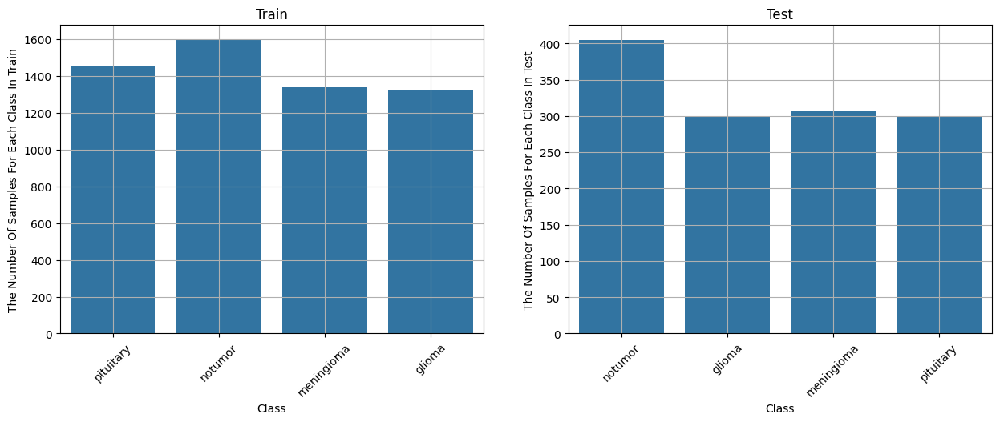

In [31]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.countplot(x=train2.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,2,2)
ax = sns.countplot(x=test2.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [32]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

x_train = [] # training images.
y_train  = [] # training labels.
x_test = [] # testing images.
y_test = [] # testing labels.

image_size = 224


for label in labels:
    trainPath = os.path.join(train_set2,label)
    for file in tqdm(os.listdir(trainPath)):
        image = cv2.imread(os.path.join(trainPath, file),0)# load images in gray.
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50) # remove images noise.
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE) # produce a pseudocolored image.
        image = cv2.resize(image, (image_size, image_size)) # resize images into 224*224.

        x_train.append(image)
        y_train.append(labels.index(label))

    testPath = os.path.join(test_set2,label)
    for file in tqdm(os.listdir(testPath)):
        image = cv2.imread(os.path.join(testPath, file),0)
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50)
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE)
        image = cv2.resize(image, (image_size, image_size))
        x_test.append(image)
        y_test.append(labels.index(label))

100%|██████████| 300/300 [00:10<00:00, 27.47it/s]


In [33]:
def crop_img(img):
	"""
	Finds the extreme points on the image and crops the rectangular out of them
	"""
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (3, 3), 0)

	# threshold the image, then perform a series of erosions +
	# dilations to remove any small regions of noise
	thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
	thresh = cv2.erode(thresh, None, iterations=2)
	thresh = cv2.dilate(thresh, None, iterations=2)

	# find contours in thresholded image, then grab the largest one
	cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)

	# find the extreme points
	extLeft = tuple(c[c[:, :, 0].argmin()][0])
	extRight = tuple(c[c[:, :, 0].argmax()][0])
	extTop = tuple(c[c[:, :, 1].argmin()][0])
	extBot = tuple(c[c[:, :, 1].argmax()][0])
	ADD_PIXELS = 0
	new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

	return new_img

if __name__ == "__main__":
	training = train_set2
	testing = test_set2
	training_dir = os.listdir(training)
	testing_dir = os.listdir(testing)
	IMG_SIZE = 224

	for dir in training_dir:
		save_path = 'cleanedagain/Training/'+ dir
		path = os.path.join(training,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

	for dir in testing_dir:
		save_path = 'cleanedagain/Testing/'+ dir
		path = os.path.join(testing,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

In [34]:
folders_train=glob('/content//cleanedagain/Training/*')
folders_train

['/content//cleanedagain/Training/pituitary',
 '/content//cleanedagain/Training/glioma',
 '/content//cleanedagain/Training/meningioma',
 '/content//cleanedagain/Training/notumor']

In [35]:
folders_test=glob('/content//cleanedagain/Testing/*')
folders_test

['/content//cleanedagain/Testing/pituitary',
 '/content//cleanedagain/Testing/glioma',
 '/content//cleanedagain/Testing/meningioma',
 '/content//cleanedagain/Testing/notumor']

In [36]:
import os
import shutil

# Path to your training directory
train_dir =('/content/cleanedagain/Training')

# Names of the categories you want to merge
categories_to_merge = ['glioma', 'meningioma', 'pituitary']  # Replace with your actual category names

# Name of the new merged category
merged_category_name = 'tumor'

# Create the new merged category folder
merged_category_path = os.path.join(train_dir, merged_category_name)
os.makedirs(merged_category_path, exist_ok=True)  # Create if it doesn't exist

# Move images from the three categories to the merged folder
for category in categories_to_merge:
    category_path = os.path.join(train_dir, category)
    for image_file in os.listdir(category_path):
        source_path = os.path.join(category_path, image_file)
        destination_path = os.path.join(merged_category_path, image_file)
        shutil.move(source_path, destination_path)  # Move the image


In [37]:
import os
import shutil

# Path to your training directory
test_dir =('/content/cleanedagain/Testing')

# Names of the categories you want to merge
categories_to_merge = ['glioma', 'meningioma', 'pituitary']  # Replace with your actual category names

# Name of the new merged category
merged_category_name = 'tumor'

# Create the new merged category folder
merged_category_path = os.path.join(test_dir, merged_category_name)
os.makedirs(merged_category_path, exist_ok=True)  # Create if it doesn't exist

# Move images from the three categories to the merged folder
for category in categories_to_merge:
    category_path = os.path.join(test_dir, category)
    for image_file in os.listdir(category_path):
        source_path = os.path.join(category_path, image_file)
        destination_path = os.path.join(merged_category_path, image_file)
        shutil.move(source_path, destination_path)  # Move the image

In [38]:
drop=('/content//cleanedagain/Training/pituitary')
shutil.rmtree(drop)

In [39]:
drop=('/content//cleanedagain/Training/glioma')
shutil.rmtree(drop)

In [40]:
drop=('/content//cleanedagain/Training/meningioma')
shutil.rmtree(drop)

In [41]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

[]

In [42]:
drop=('/content//cleanedagain/Testing/pituitary')
shutil.rmtree(drop)

In [43]:
drop=('/content//cleanedagain/Testing/glioma')
shutil.rmtree(drop)

In [44]:
drop=('/content//cleanedagain/Testing/meningioma')
shutil.rmtree(drop)

In [45]:
folders_test=glob('/content//cleanedagain/Testing/*')
folders_test

['/content//cleanedagain/Testing/tumor',
 '/content//cleanedagain/Testing/notumor']

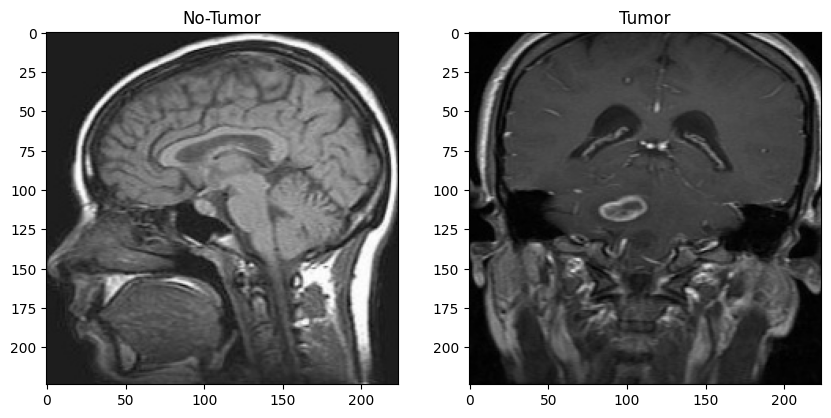

In [46]:
import matplotlib.pyplot as plt
import os

def compare_images(image1_path, image2_path):
  # Load images
  # Get an image file from within the directories
  image1_file = os.path.join(image1_path, os.listdir(image1_path)[0])
  image2_file = os.path.join(image2_path, os.listdir(image2_path)[0])

  img1 = plt.imread(image1_file)
  img2 = plt.imread(image2_file)

  # Create subplots
  fig, axes = plt.subplots(1, 2, figsize=(10, 5))

  # Display images
  axes[0].imshow(img1)
  axes[0].set_title('No-Tumor')
  axes[1].imshow(img2)
  axes[1].set_title('Tumor')

  plt.show()

# Example usage - Pass directory paths
compare_images('/content//cleanedagain/Training/notumor', '/content//cleanedagain/Training/tumor')

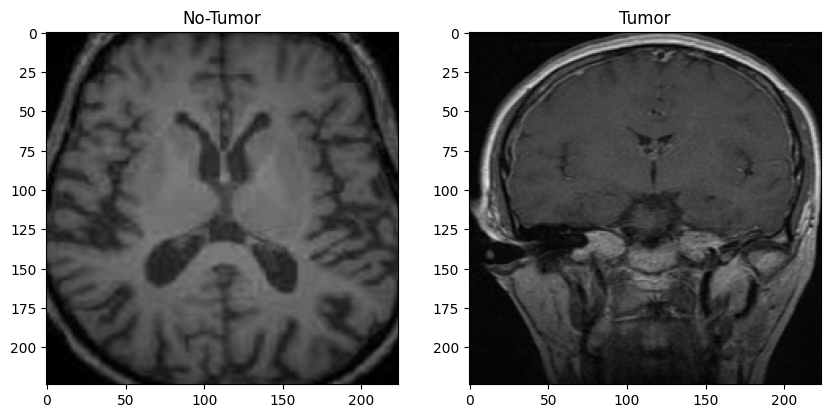

In [47]:
import matplotlib.pyplot as plt
import os

def compare_images(image1_path, image2_path):
  # Load images
  # Get an image file from within the directories
  image1_file = os.path.join(image1_path, os.listdir(image1_path)[0])
  image2_file = os.path.join(image2_path, os.listdir(image2_path)[0])

  img1 = plt.imread(image1_file)
  img2 = plt.imread(image2_file)

  # Create subplots
  fig, axes = plt.subplots(1, 2, figsize=(10, 5))

  # Display images
  axes[0].imshow(img1)
  axes[0].set_title('No-Tumor')
  axes[1].imshow(img2)
  axes[1].set_title('Tumor')

  plt.show()

# Example usage - Pass directory paths
compare_images('/content//cleanedagain/Testing/notumor', '/content//cleanedagain/Testing/tumor')

In [ ]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [ ]:
prediction=Dense(2, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [ ]:
model2=Model(inception.input, prediction)
model2.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          65,6

 Total params: 14,780,610 (56.38 MB)

 Trainable params: 65,922 (257.51 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

In [ ]:
datagen1 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
train_set2 = datagen1.flow_from_directory(
    '/content//cleanedagain/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 4570 images belonging to 2 classes.


In [ ]:
test_set2 = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleanedagain/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 1311 images belonging to 2 classes.


In [ ]:
r=model2.fit(train_set2,validation_data=test_set2,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


191/191 ━━━━━━━━━━━━━━━━━━━━ 120s 514ms/step - accuracy: 0.8337 - auc: 0.9060 - loss: 0.3782 - specificity_at_sensitivity: 0.9588 - val_accuracy: 0.9237 - val_auc: 0.9724 - val_loss: 0.2060 - val_specificity_at_sensitivity: 0.9916
Epoch 2/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 75s 375ms/step - accuracy: 0.9508 - auc: 0.9889 - loss: 0.1369 - specificity_at_sensitivity: 0.9989 - val_accuracy: 0.9405 - val_auc: 0.9741 - val_loss: 0.1926 - val_specificity_at_sensitivity: 0.9924
Epoch 3/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 76s 380ms/step - accuracy: 0.9532 - auc: 0.9906 - loss: 0.1244 - specificity_at_sensitivity: 0.9993 - val_accuracy: 0.9420 - val_auc: 0.9791 - val_loss: 0.1787 - val_specificity_at_sensitivity: 0.9931
Epoch 4/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 74s 375ms/step - accuracy: 0.9591 - auc: 0.9933 - loss: 0.1040 - specificity_at_sensitivity: 0.9990 - val_accuracy: 0.9413 - val_auc: 0.9795 - val_loss: 0.1939 - val_specificity_at_sensitivity: 0.9947
Epoch 5/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 81

In [ ]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
53,0.985996,0.997778,0.045480,0.998906,0.971014,0.991870,0.104848,0.994661
54,0.987527,0.998882,0.037147,0.999781,0.976354,0.991685,0.104315,0.994661
55,0.985996,0.999079,0.038137,1.000000,0.967963,0.991259,0.123914,0.993898
56,0.984245,0.998452,0.043569,0.999562,0.974066,0.992116,0.105265,0.994661
57,0.986652,0.998976,0.037868,0.999781,0.968726,0.991675,0.125494,0.994661


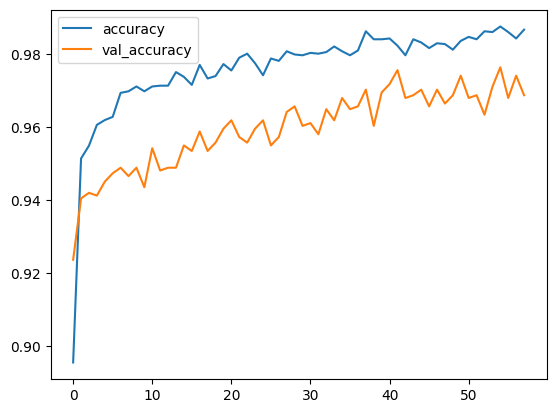

In [ ]:
df_inception[["accuracy","val_accuracy"]].plot();

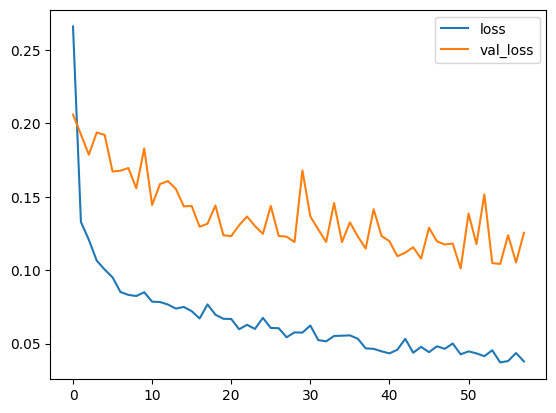

In [ ]:
df_inception[["loss","val_loss"]].plot();

In [ ]:
hist_=pd.DataFrame(r.history)
hist_

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.895624,0.961830,0.266086,0.994311,0.923722,0.972356,0.206015,0.991609
1,0.951422,0.988997,0.132886,0.998031,0.940503,0.974105,0.192574,0.992372
2,0.954923,0.990851,0.120762,0.999125,0.942029,0.979119,0.178692,0.993135
3,0.960613,0.992348,0.106534,0.998468,0.941266,0.979514,0.193862,0.994661
4,0.961926,0.993400,0.100481,0.998687,0.945080,0.978746,0.192225,0.992372
5,0.962801,0.994295,0.095165,1.000000,0.947368,0.980891,0.167240,0.993135
6,0.969365,0.994988,0.085135,0.999562,0.948894,0.981114,0.167813,0.992372
7,0.969803,0.995452,0.083189,0.999781,0.946606,0.984573,0.169631,0.995423
8,0.971116,0.995271,0.082427,0.999344,0.948894,0.985262,0.155869,0.995423
9,0.969803,0.994349,0.085018,0.998468,0.943555,0.982094,0.182973,0.993898


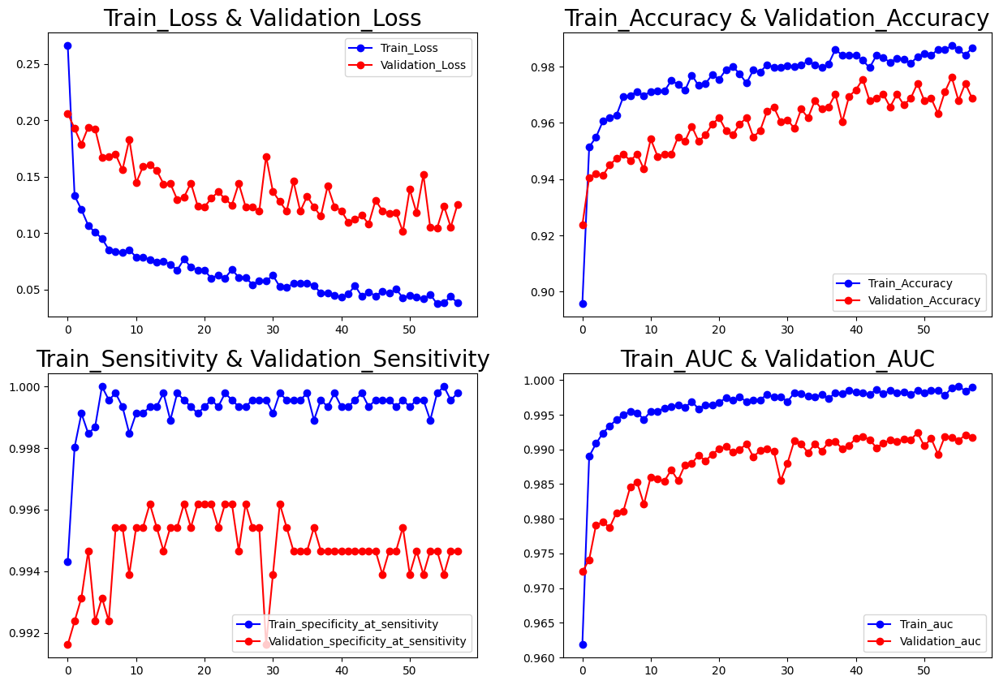

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score,acc,sensitivity,auc= model2.evaluate(test_set2)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.9163 - auc: 0.9549 - loss: 0.3739 - specificity_at_sensitivity: 0.9747
Test Loss = 0.12549421191215515
Test Accuracy = 0.9687261581420898
Test Sensitivity = 0.9946605563163757
Test AUC = 0.9916753172874451


In [ ]:
y_test2 =test_set2.classes
predictions = model2.predict(test_set2)

# Find the class with the highest predicted probability for each sample
y_pred2 = np.argmax(predictions, axis=1)

y_test2 = np.ravel(y_test2)
df = pd.DataFrame({'Actual': y_test2, 'Prediction': y_pred2})
print(df)

55/55 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step
      Actual  Prediction
0          0           1
1          0           0
2          0           0
3          0           0
4          0           0
...      ...         ...
1306       1           1
1307       1           1
1308       1           1
1309       1           1
1310       1           1

[1311 rows x 2 columns]


In [ ]:


 y_test2[100]


0

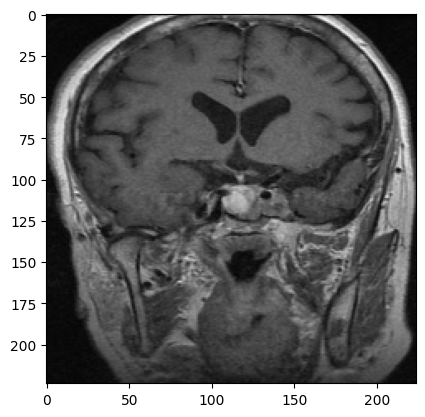

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the dataset to access the 100th image
i = 0
for image, label in test_set2:
    if i == 100:
        plt.imshow(image[0])  # Assuming image is in a batch format
        plt.show()
        break
    i += 1

In [ ]:
y_pred2[100]

0

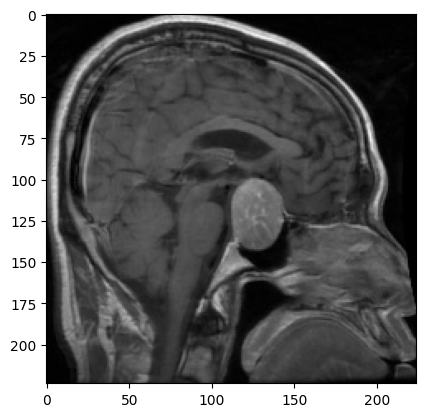

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the dataset to access the 100th image
i = 0
for image, label in test_set2:
    if i == 0:
        plt.imshow(image[0])  # Assuming image is in a batch format
        plt.show()
        break
    i += 1

In [ ]:
y_pred2[0]

1

array([[371,  34],
       [  7, 899]])

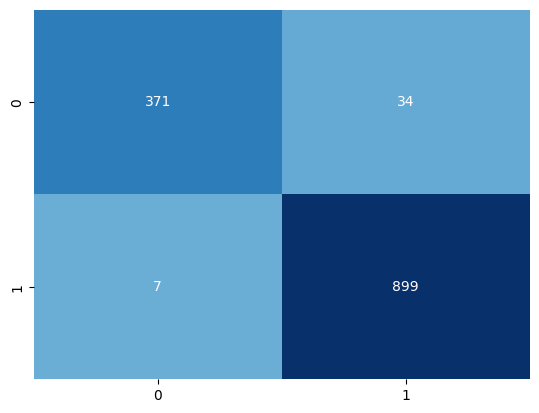

In [ ]:
CM = confusion_matrix(y_test2,y_pred2)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test2,y_pred2)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.98      0.92      0.95       405
           1       0.96      0.99      0.98       906

    accuracy                           0.97      1311
   macro avg       0.97      0.95      0.96      1311
weighted avg       0.97      0.97      0.97      1311

